In [2]:
import scipy
import json
import os

import pandas as pd
import seaborn as sns
import scipy.stats

import matplotlib.pyplot as plt

In [3]:
def load_single_contribution_attack_results(
    scenario: str,
    version: str,
    dataset: str
):
    '''Loads json file (attack results) and csv files (Shapley, LOO)
    into a one pandas dataframe'''
    
    ## Loads the json file with atack metrics
    metrics = ['TPR', 'AUC']
    json_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'nodes_attack_results.json')
    shapley_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_shapley.csv')
    loo_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_loo.csv')
    with open(json_path, 'r+') as file:
        json_file = json.load(file)
    clients_ids = [int(i) for i in json_file.keys() if i != 'average']
    iterations = [int(i) for i in json_file['0'].keys()]
    iterations.sort()
    headings = [f'{client}_{metric}' for client in clients_ids for metric in metrics]
    
    dataframe = pd.DataFrame(index=iterations, columns=headings)
    
    # Loads attack results into the frame
    for client in clients_ids:
        for iteration in iterations:
            client_data = json_file[str(client)][str(iteration)]['average']
            for heading in metrics:
                dataframe.loc[iteration, f"{client}_{heading}"] = client_data[heading]
    
    # Loads shapley into the frame
    shapley_frame = pd.read_csv(shapley_path)
    loo_frame = pd.read_csv(loo_path)
    for client in clients_ids:
        # Loads shapley values
        array = shapley_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_ACC'] = array
        array = shapley_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_F1SCORE'] = array
        
        # Loads LOO values
        array = loo_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_LOO_ACC'] = array
        array = loo_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_LOO_F1SCORE'] = array
    
    return dataframe

In [4]:
def load_single_contribution_attack_results(
    scenario: str,
    version: str,
    dataset: str
):
    '''Loads json file (attack results) and csv files (Shapley, LOO)
    into a one pandas dataframe'''
    
    ## Loads the json file with atack metrics
    metrics = ['TPR', 'AUC']
    json_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'nodes_attack_results.json')
    shapley_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_shapley.csv')
    loo_path = os.path.join(os.getcwd(), 'attack_results', scenario, version, dataset, 'results', 'partial_loo.csv')
    with open(json_path, 'r+') as file:
        json_file = json.load(file)
    clients_ids = [int(i) for i in json_file.keys() if i != 'average']
    iterations = [int(i) for i in json_file['0'].keys()]
    iterations.sort()
    headings = [f'{client}_{metric}' for client in clients_ids for metric in metrics]
    
    dataframe = pd.DataFrame(index=iterations, columns=headings)
    
    # Loads attack results into the frame
    for client in clients_ids:
        for iteration in iterations:
            client_data = json_file[str(client)][str(iteration)]['average']
            for heading in metrics:
                dataframe.loc[iteration, f"{client}_{heading}"] = client_data[heading]
    
    # Loads shapley into the frame
    shapley_frame = pd.read_csv(shapley_path)
    loo_frame = pd.read_csv(loo_path)
    for client in clients_ids:
        # Loads shapley values
        array = shapley_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_ACC'] = array
        array = shapley_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_SHAP_F1SCORE'] = array
        
        # Loads LOO values
        array = loo_frame[shapley_frame['node_id'] == client]['accuracy'].reset_index(drop=True)
        dataframe[f'{client}_LOO_ACC'] = array
        array = loo_frame[shapley_frame['node_id'] == client]['f1score'].reset_index(drop=True)
        dataframe[f'{client}_LOO_F1SCORE'] = array
    
    return dataframe

In [5]:
def load_multiple_contribution_attack_results(
    scenarios: list[str],
    versions: list[str],
    datasets: list[str]
):
    all_results = {
        f"{scenario}_{version}_{dataset}" : None
        for scenario in scenarios
        for version in versions
        for dataset in datasets
    }
    for scenario in scenarios:
        for version in versions:
            for dataset in datasets:
                key = f"{scenario}_{version}_{dataset}"
                all_results[key] = load_single_contribution_attack_results(
                    scenario=scenario,
                    version=version,
                    dataset=dataset
                    )
    return all_results

In [6]:
def calculate_single_corr(
    no_clients: int,
    frame: pd.DataFrame,
    mode: 'str'
):
    if mode == 'spearman':
        correlation = scipy.stats.spearmanr
    elif mode =='pearson':
        correlation = scipy.stats.pearsonr
    else:
        assert NameError
    corr_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_ACC']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_ACC']
        ).statistic
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_F1SCORE']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_F1SCORE']
        ).statistic
        
        corr_frame.loc[client, 'TPR_TO_LOO_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_ACC']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_LOO_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_ACC']
        ).statistic
        corr_frame.loc[client, 'TPR_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_F1SCORE']
        ).statistic
        corr_frame.loc[client, 'AUC_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_F1SCORE']
        ).statistic
    return corr_frame

In [7]:
def calculate_single_corr_short(
    no_clients: int,
    frame: pd.DataFrame,
    mode: 'str'
):
    if mode == 'spearman':
        correlation = scipy.stats.spearmanr
    elif mode =='pearson':
        correlation = scipy.stats.pearsonr
    else:
        assert NameError
    corr_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        corr = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_ACC']
        )
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC CORR'] = corr.statistic
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC P-VALUE'] = corr.pvalue
        
        corr = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_F1SCORE']
        )
        
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE'] = corr.statistic
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE P-VALUE'] = corr.pvalue
        
    return corr_frame

In [8]:
def calculate_multiple_corr_short(
    results : dict,
    no_clients : int,
    mode : str
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_corr_short(frame=frame, no_clients=no_clients, mode=mode)
    return all_results

In [9]:
def calculate_multiple_corr(
    results : dict,
    no_clients : int,
    mode : str
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_corr(frame=frame, no_clients=no_clients, mode=mode)
    return all_results

In [10]:
def calculate_single_pvalue(
    no_clients: int,
    frame: pd.DataFrame,
    mode: 'str'
):
    if mode == 'spearman':
        correlation = scipy.stats.spearmanr
    elif mode =='pearson':
        correlation = scipy.stats.pearsonr
    else:
        assert NameError
    corr_frame = pd.DataFrame(index=range(no_clients))
    
    for client in range(no_clients):
        corr_frame.loc[client, 'TPR_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_ACC']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_SHAP_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_ACC']
        ).pvalue
        corr_frame.loc[client, 'TPR_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_SHAP_F1SCORE']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_SHAP_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_SHAP_F1SCORE']
        ).pvalue
        
        corr_frame.loc[client, 'TPR_TO_LOO_ACC'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_ACC']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_LOO_ACC'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_ACC']
        ).pvalue
        corr_frame.loc[client, 'TPR_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_TPR'],
            frame[f'{client}_LOO_F1SCORE']
        ).pvalue
        corr_frame.loc[client, 'AUC_TO_LOO_F1SCORE'] = correlation(
            frame[f'{client}_AUC'],
            frame[f'{client}_LOO_F1SCORE']
        ).pvalue
    return corr_frame

In [11]:
def calculate_multiple_pvalues(
    results : dict,
    no_clients : int,
    mode : str
):
    all_results = {key:None for key in results.keys()}
    for key, frame in results.items():
        all_results[key] = calculate_single_pvalue(frame=frame, no_clients=no_clients, mode=mode)
    return all_results

# Stage I: Visualization of timeline progression

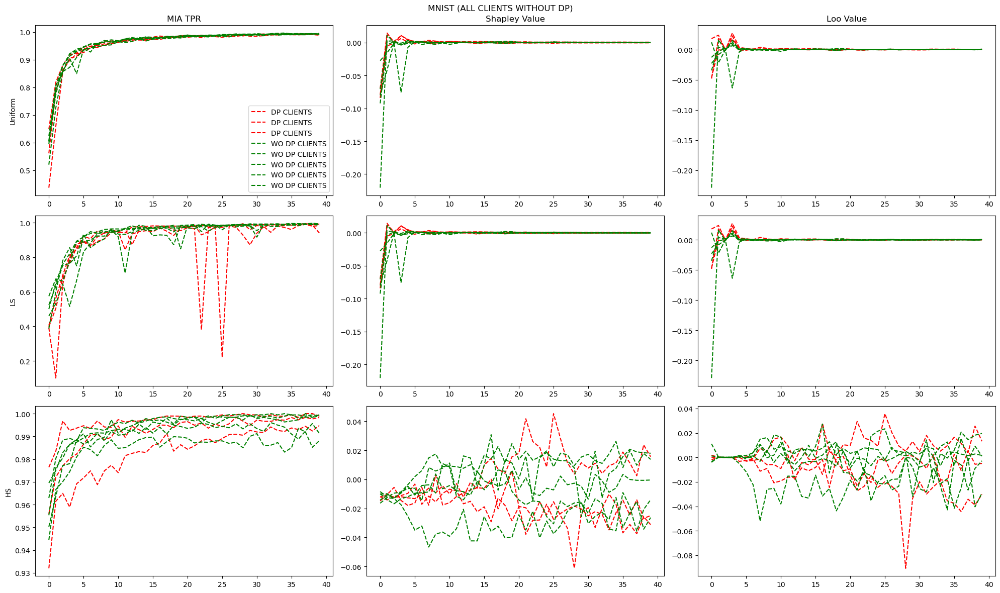

In [12]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

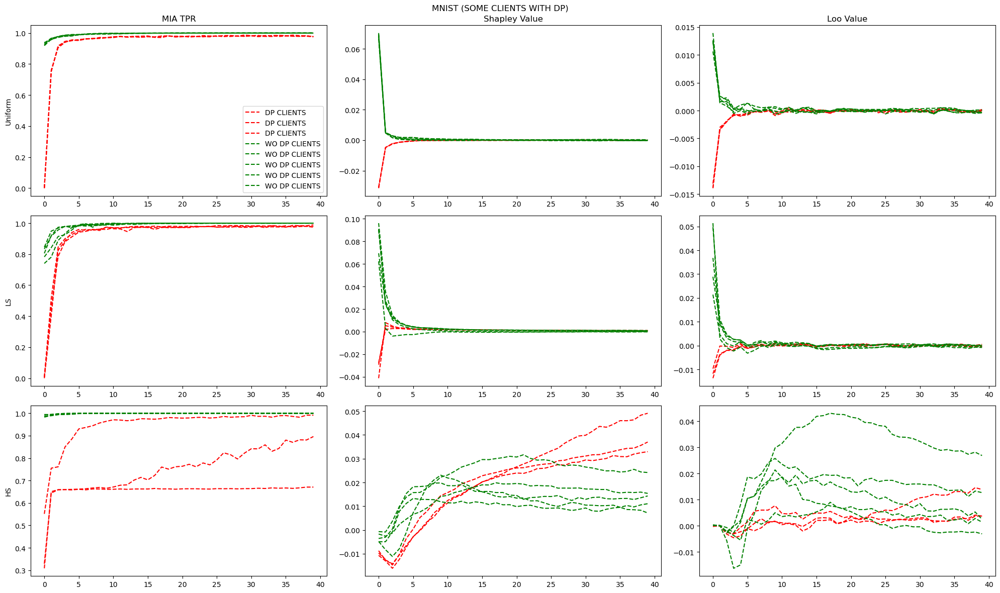

In [13]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

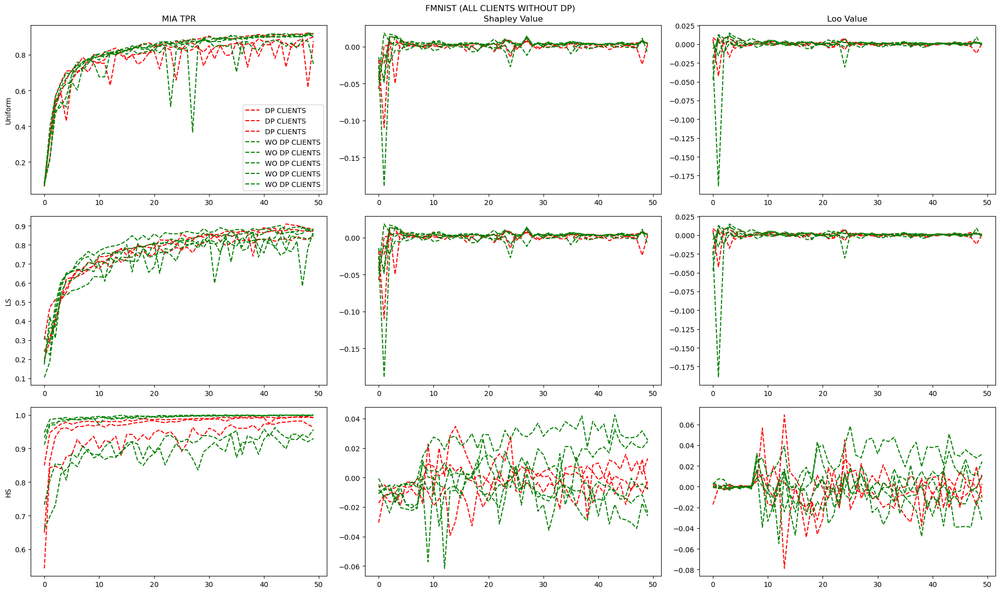

In [14]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

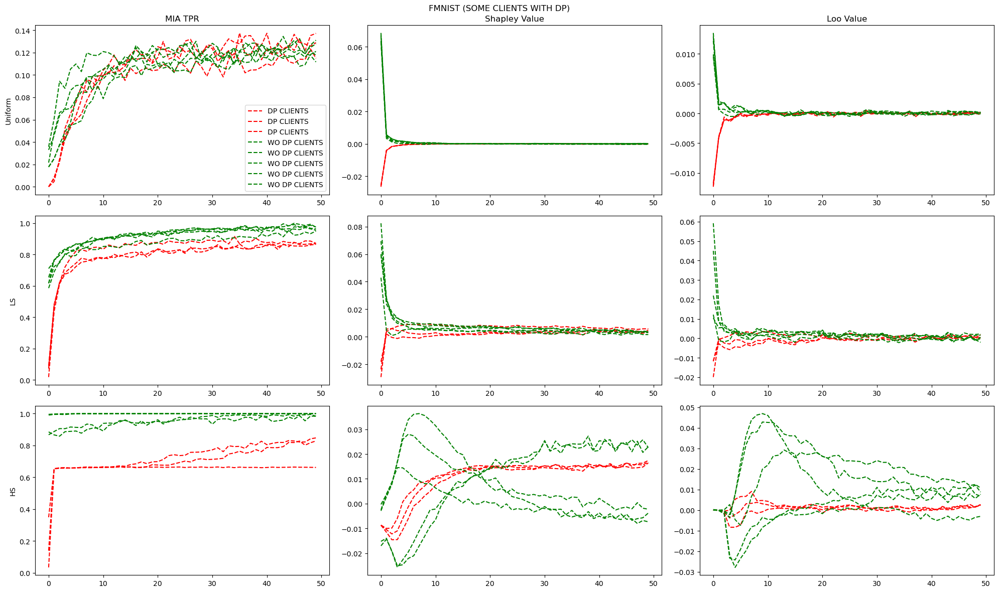

In [15]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

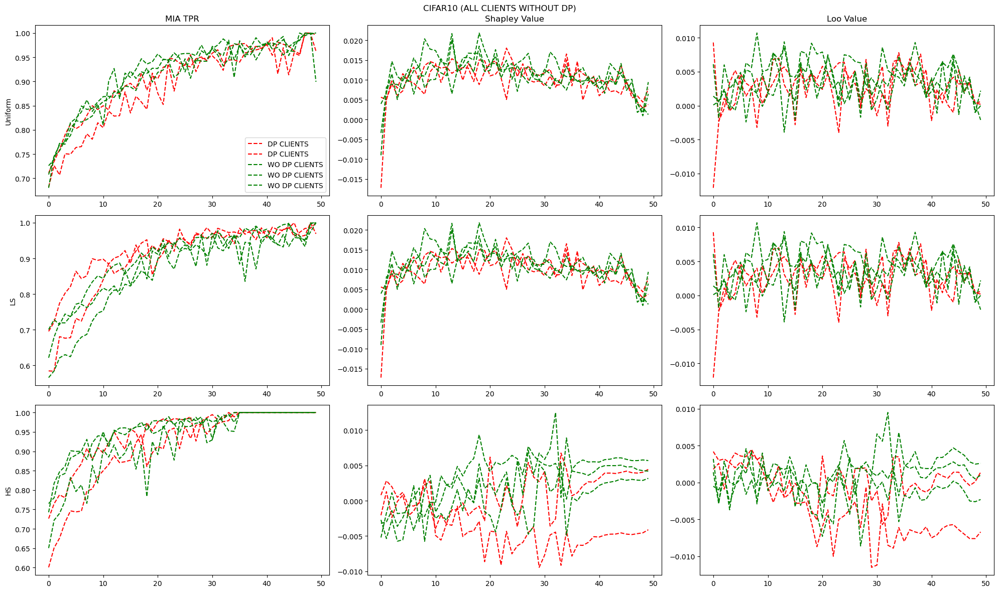

In [16]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR10 (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

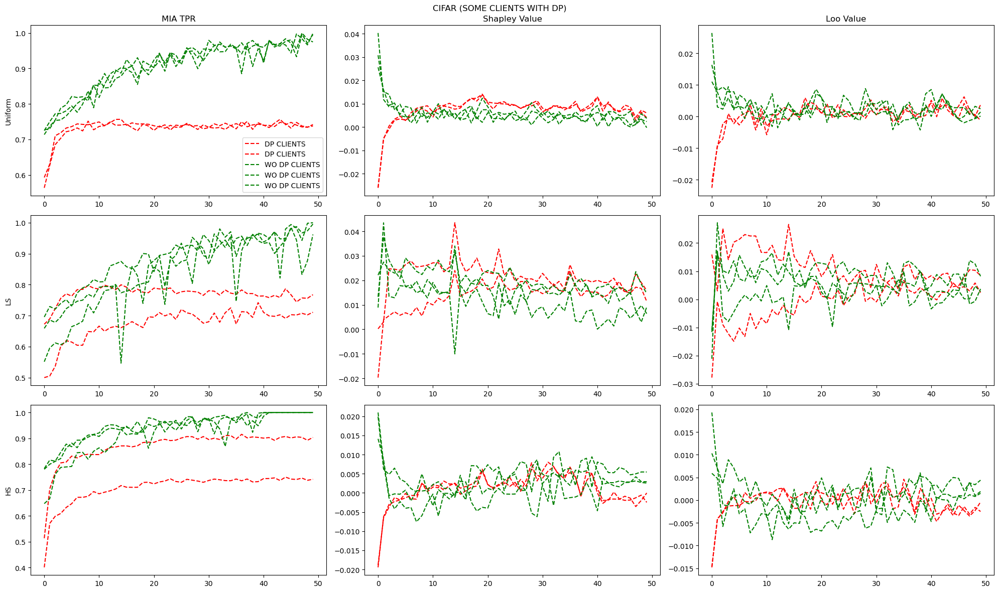

In [17]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR (SOME CLIENTS WITH DP)")
fig.tight_layout()

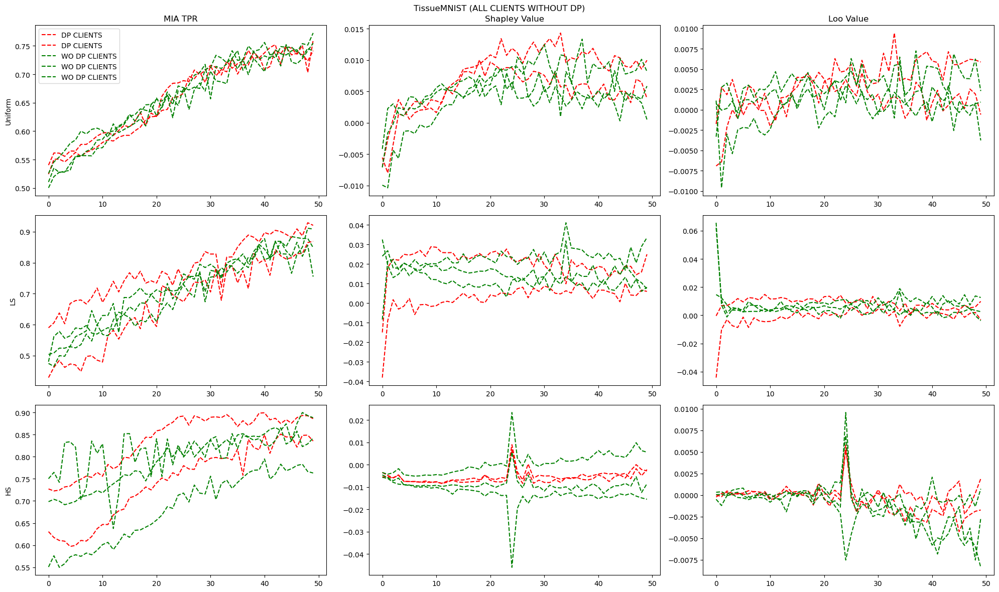

In [18]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

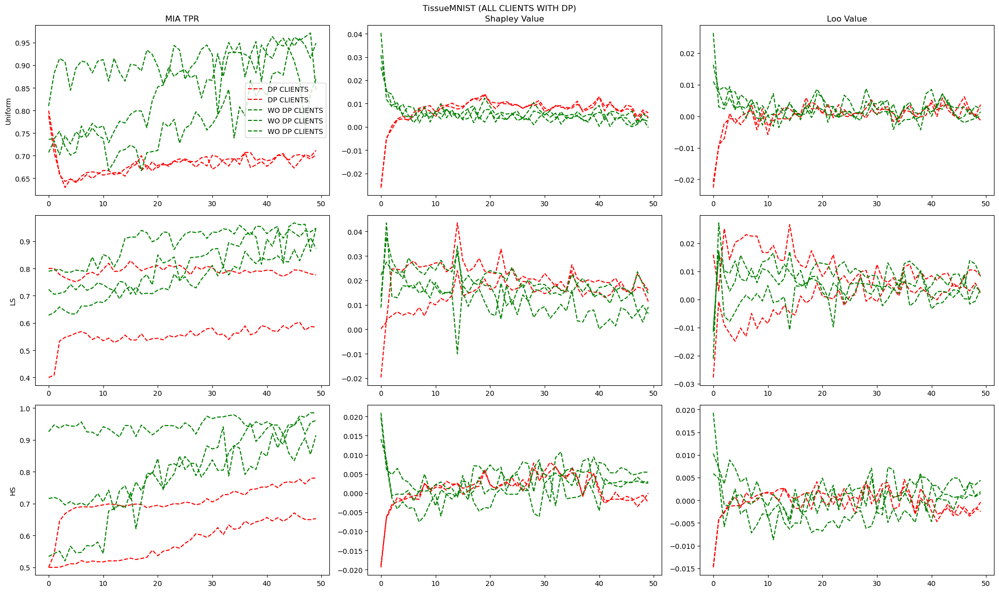

In [19]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], 'r--', label='DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'r--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], 'r--')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], 'g--', label='WO DP CLIENTS')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], 'g--')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], 'g--')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (ALL CLIENTS WITH DP)")
fig.tight_layout()

# Stage I: Visualization of timeline progression (color-coded clients)

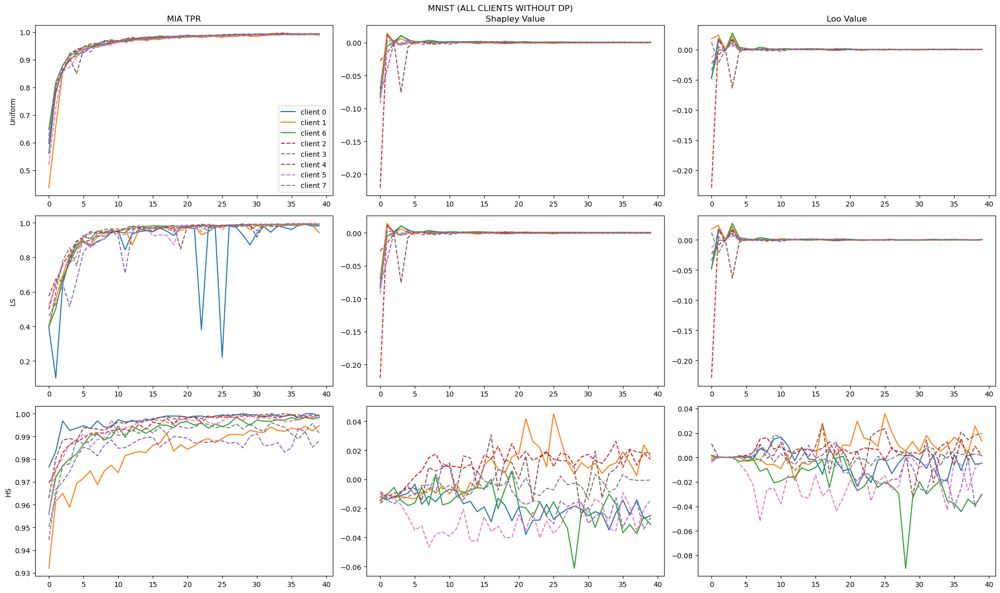

In [26]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_mnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

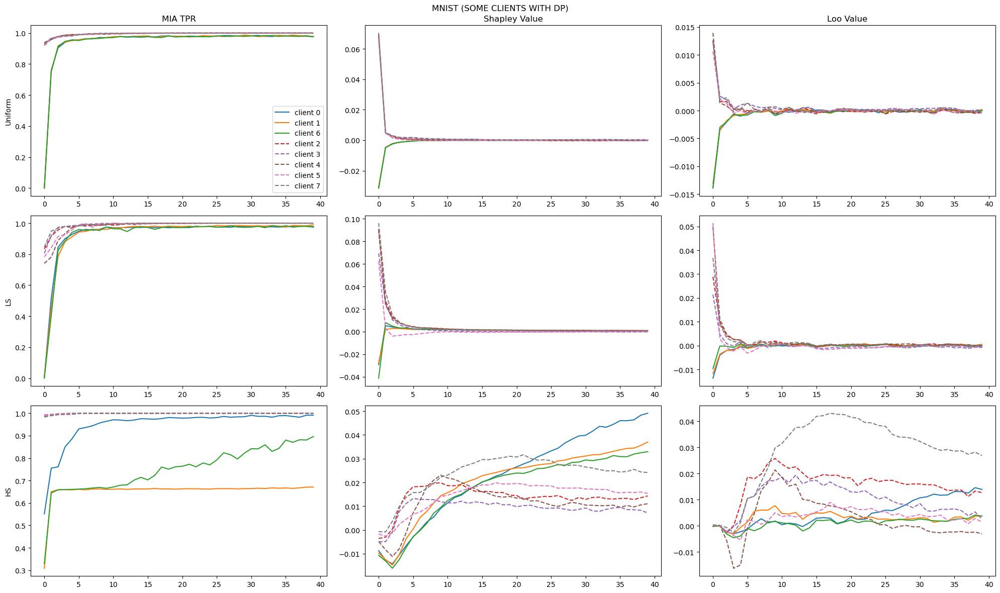

In [27]:
datasets = ['mnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_mnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("MNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

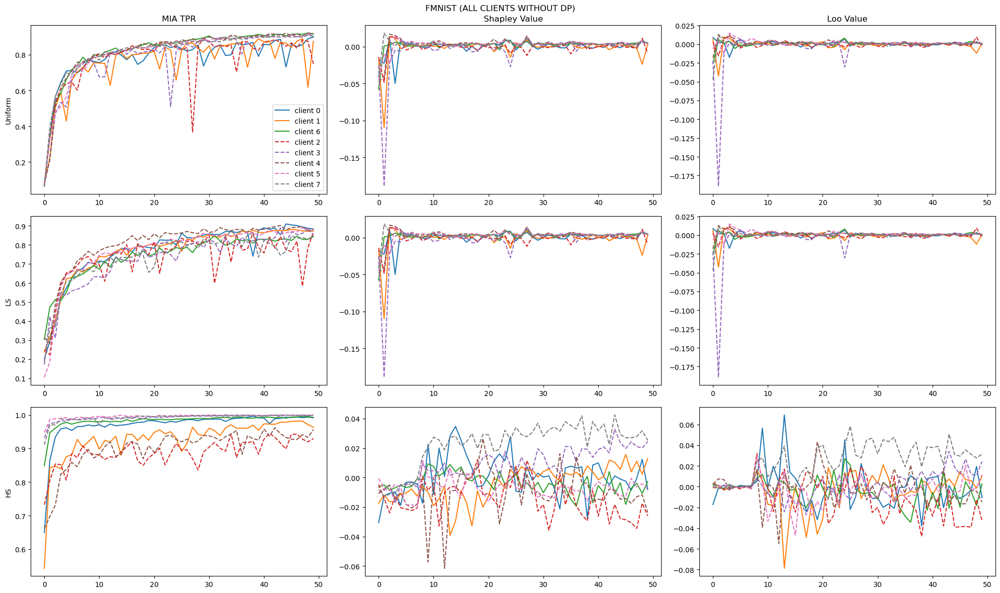

In [29]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_fmnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

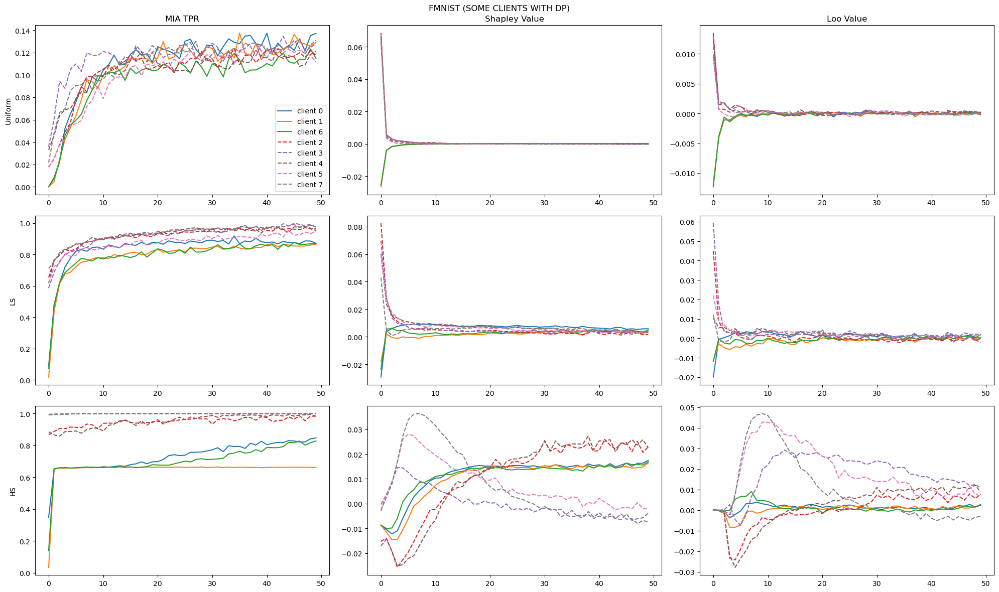

In [30]:
datasets = ['fmnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 1, 6]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [2, 3, 4, 5, 7]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_fmnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("FMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

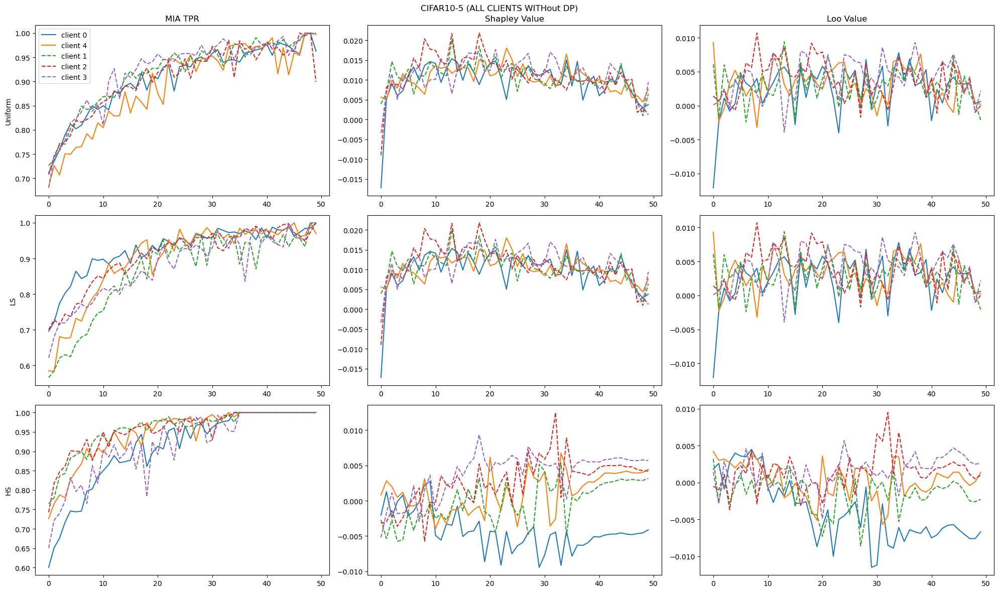

In [33]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_cifar10-5'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR10-5 (ALL CLIENTS WITHout DP)")
fig.tight_layout()

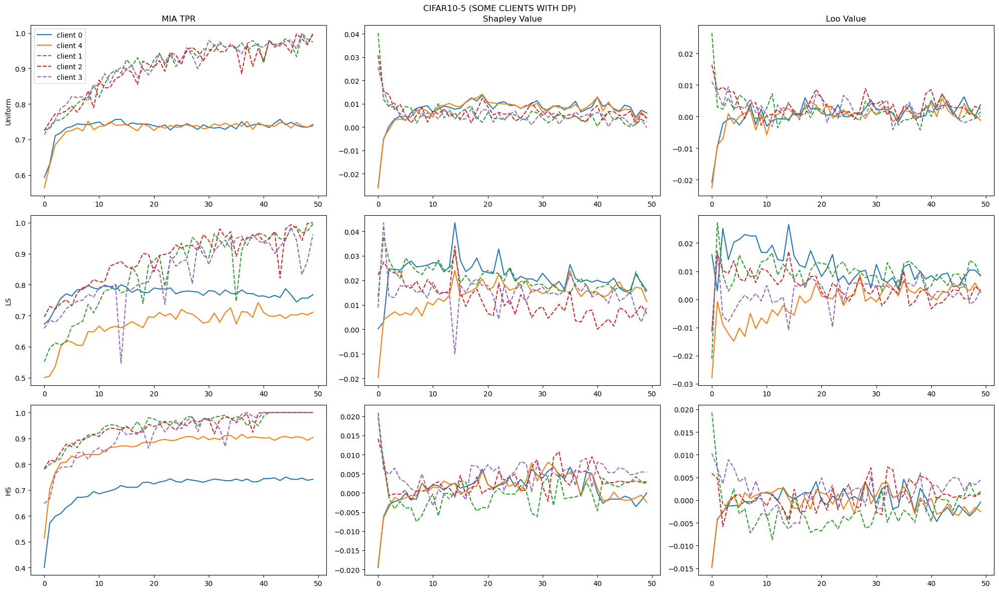

In [34]:
datasets = ['cifar10-5']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_cifar10-5'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("CIFAR10-5 (SOME CLIENTS WITH DP)")
fig.tight_layout()

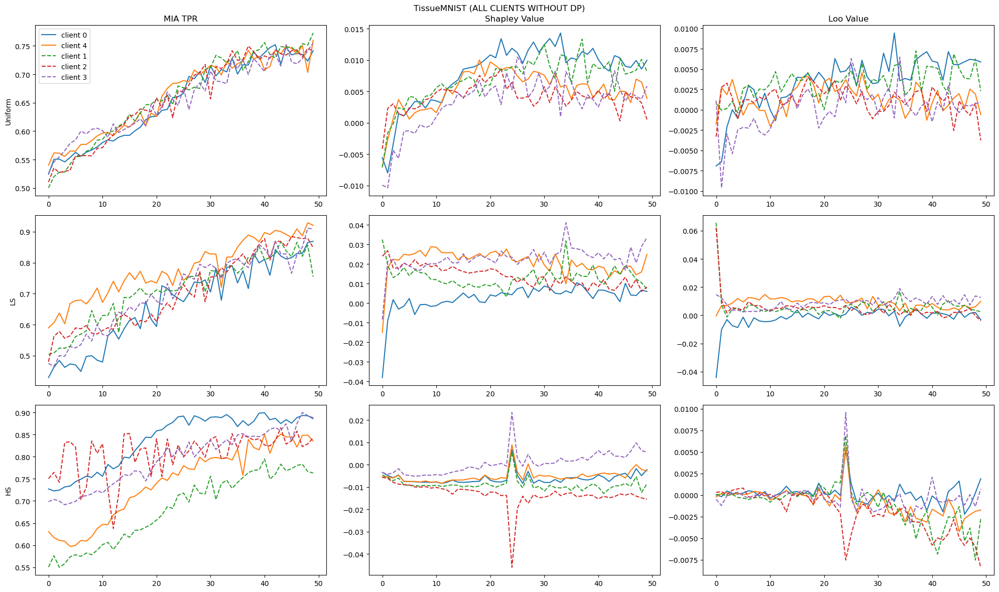

In [35]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['without_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_without_DP_tissuemnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (ALL CLIENTS WITHOUT DP)")
fig.tight_layout()

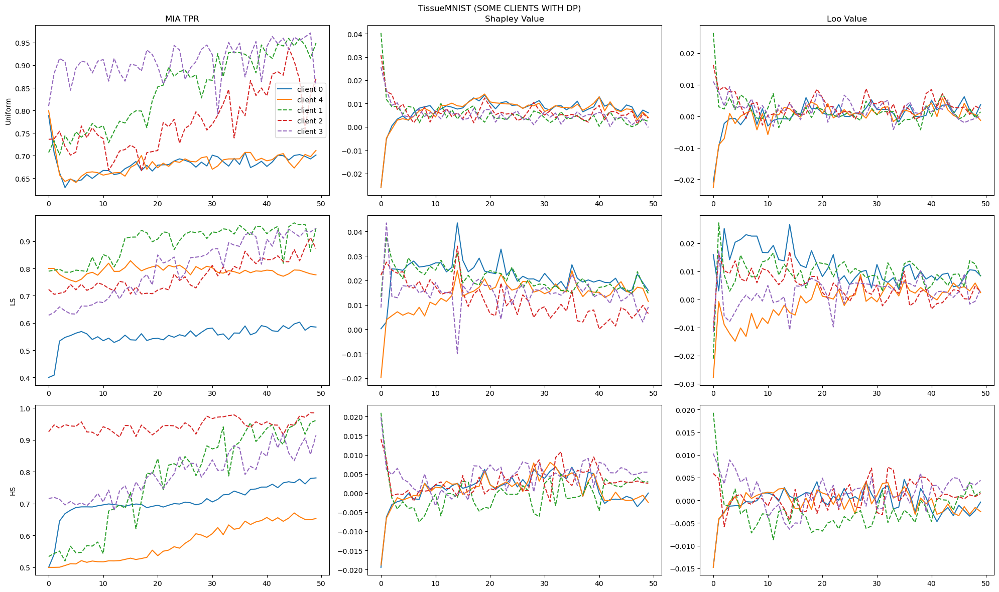

In [36]:
datasets = ['tissuemnist']
scenarios = ['uniform', 'ls', 'hs']
versions = ['with_DP']
fig, axes = plt.subplots(3, 3, figsize=(20, 12))

results_MNIST = load_multiple_contribution_attack_results(
    datasets=datasets,
    scenarios=scenarios,
    versions=versions
)

for scenario, axs in zip(scenarios, axes):
    for client in [0, 4]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], '-', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], '-', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], '-', label=f'client {client}')
    for client in [1, 2, 3]:
        axs[0].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_TPR'], '--', label=f'client {client}')
        axs[1].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_SHAP_ACC'], '--', label=f'client {client}')
        axs[2].plot(results_MNIST[f'{scenario}_with_DP_tissuemnist'][f'{client}_LOO_ACC'], '--', label=f'client {client}')
    
axes[0,0].legend()
axes[0,0].set_title("MIA TPR")
axes[0,1].set_title("Shapley Value")
axes[0,2].set_title("Loo Value")

axes[0,0].set_ylabel('Uniform')
axes[1,0].set_ylabel('LS')
axes[2,0].set_ylabel('HS')

fig.suptitle("TissueMNIST (SOME CLIENTS WITH DP)")
fig.tight_layout()

# My Observations based on Stage I:
- There is no visible correlation between SV and MIA's TPR in the scenario where all clients are clear of any DP mechanism -> so where the only difference in local model's impact on the global model's performance is coming either from data split, model initialization, convergence to different minimas etc. It would be very difficult to use those values as a tool for enhancing the MIA attack.
- There is some mild correlation between SV and TPR in the second case - where some clients are using a DP mechanism. However, it is contrained to:
    a) Only a few first rounds -> in the long run, the DP clients seem to act as a regularizer and even receive positive SV's.
    b) The split of the dataset against which the SV are evaluated must at least resemble the local distribution. If that is not the case, the observations breaks apart and there is no visible pattern.